In [1]:
import os
os.sys.path.append("C:\\Users\mplitt\MightyMorphingPhotonRangers")
import numpy as np
import matplotlib.pyplot as plt

import utilities as u
import preprocessing as pp
import behavior as b
import SimilarityMatrixAnalysis as sm
import scipy as sp
import PlaceCellAnalysis as pc
from SplineEncodingModel.LinearRegressionSpline import EncodingModel, NBDecodingModel
import matplotlib.gridspec as gridspec

%load_ext autoreload
%autoreload 2

%matplotlib inline

In [8]:
mouse = '4222153.1'
df = pp.load_session_db()


df = df[df['RewardCount']>30]
df = df[df['Imaging']==1]
df = df.sort_values(['MouseName','DateTime','SessionNumber'])
tracks = 'TwoTower_noTimeout|TwoTower_Timeout|Reversal_noTimeout|Reversal|TwoTower_foraging'
df = df[df['Track'].str.contains(tracks,regex=True)]

df_mouse = df[df['MouseName'].str.match(mouse)]
# df_mouse = df_mouse[df_mouse['Track'].str.match('TwoTower_noTimeout') | df_mouse['Track'].str.match('TwoTower_Timeout')]
df_mouse

G:\My Drive\VR_Data\TwoTower\behavior.sqlite


,MouseName,DateFolder,SessionNumber,Track,RewardCount,Imaging,ImagingRegion,DateTime,data file,scanfile,scanmat,s2pfolder
1724,4222153.1,08_04_2019,1,TwoTower_foraging,120,1,CA1,2019-04-08,G:\My Drive\VR_Data\TwoTower\4222153.1\08_04_2...,None,G:\My Drive\2P_Data\TwoTower\4222153.1\08_04_2...,G:\My Drive\2P_Data\TwoTower\4222153.1\08_04_2...
1747,4222153.1,10_04_2019,2,TwoTower_foraging,92,1,CA1,2019-04-10,G:\My Drive\VR_Data\TwoTower\4222153.1\10_04_2...,None,G:\My Drive\2P_Data\TwoTower\4222153.1\10_04_2...,G:\My Drive\2P_Data\TwoTower\4222153.1\10_04_2...
1768,4222153.1,12_04_2019,2,TwoTower_foraging,82,1,CA1,2019-04-12,G:\My Drive\VR_Data\TwoTower\4222153.1\12_04_2...,None,G:\My Drive\2P_Data\TwoTower\4222153.1\12_04_2...,G:\My Drive\2P_Data\TwoTower\4222153.1\12_04_2...
1794,4222153.1,14_04_2019,2,TwoTower_foraging,82,1,CA1,2019-04-14,G:\My Drive\VR_Data\TwoTower\4222153.1\14_04_2...,None,G:\My Drive\2P_Data\TwoTower\4222153.1\14_04_2...,G:\My Drive\2P_Data\TwoTower\4222153.1\14_04_2...
1803,4222153.1,15_04_2019,2,TwoTower_foraging,74,1,CA1,2019-04-15,G:\My Drive\VR_Data\TwoTower\4222153.1\15_04_2...,None,G:\My Drive\2P_Data\TwoTower\4222153.1\15_04_2...,G:\My Drive\2P_Data\TwoTower\4222153.1\15_04_2...
1813,4222153.1,16_04_2019,2,TwoTower_foraging,70,1,CA1,2019-04-16,G:\My Drive\VR_Data\TwoTower\4222153.1\16_04_2...,None,G:\My Drive\2P_Data\TwoTower\4222153.1\16_04_2...,G:\My Drive\2P_Data\TwoTower\4222153.1\16_04_2...
1822,4222153.1,17_04_2019,2,TwoTower_foraging,77,1,CA1,2019-04-17,G:\My Drive\VR_Data\TwoTower\4222153.1\17_04_2...,None,G:\My Drive\2P_Data\TwoTower\4222153.1\17_04_2...,G:\My Drive\2P_Data\TwoTower\4222153.1\17_04_2...


In [9]:
sess = df_mouse.iloc[-1]
# VRDat = pp.behavior_dataframe(sess['data file'])

In [10]:
VRDat,C, S, A = pp.load_scan_sess(sess)

num aberrant ttls 0.0
35977 (35977,) (35977, 21) 118959
frame diff 0


In [11]:
S[np.isnan(S)]=0
S*=.0065
Ssm = sp.ndimage.filters.gaussian_filter1d(S,5,axis=0)

In [12]:
posmask = (VRDat.pos>0) & (VRDat.pos<450) & (VRDat.speed>.2)
trial_info, tstart_inds, teleport_inds = u.by_trial_info(VRDat)
effMorph =VRDat.morph._values+VRDat.bckgndJitter._values + VRDat.wallJitter._values
effMorph = (effMorph+.2)/1.4


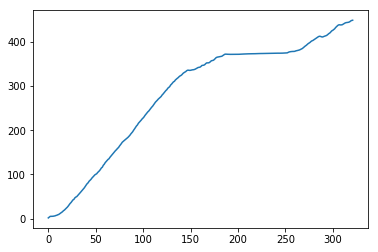

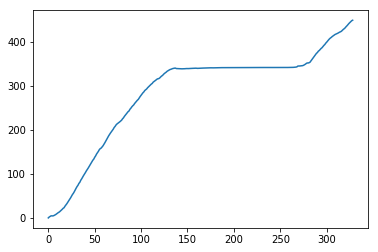

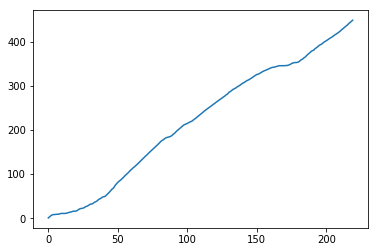

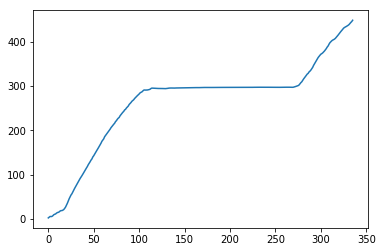

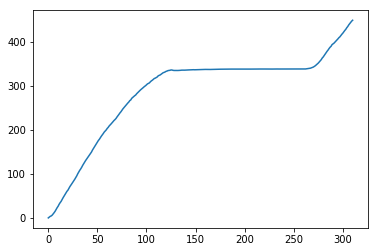

...

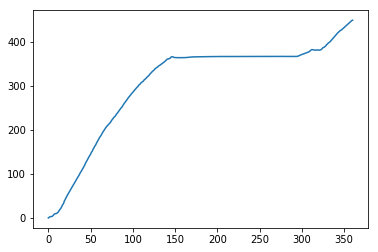

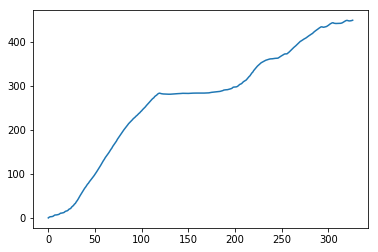

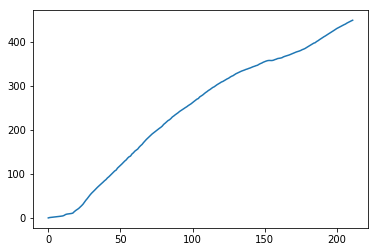

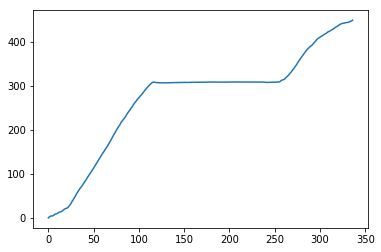

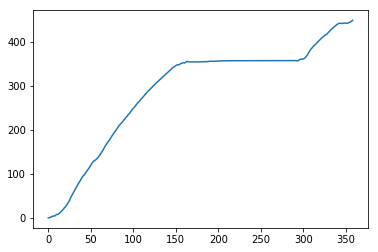

In [13]:
for start,stop in zip(tstart_inds.tolist(),teleport_inds.tolist()):
    f,ax = plt.subplots()
    ax.plot(VRDat['pos']._values[start:stop])

In [14]:
print(np.amin(effMorph),np.amax(effMorph))

-2.0 0.9718877928571429


# 3-fold cross validation to pick cells to include

In [15]:
# generate train, test masks
print(posmask.shape[0],S.shape,VRDat.shape)
randInds = np.random.permutation(tstart_inds.shape[0])
test_mask = [np.zeros([S.shape[0],]) for i in range(3)]
for cnt,ind in enumerate(randInds.tolist()):
    test_mask[cnt%3][tstart_inds[ind]:teleport_inds[ind]]+=1
    
for i in range(3):
    test_mask[i] = test_mask[i]>0
    


35977 (35977, 237) (35977, 22)


In [16]:
# fit models
Shat = np.zeros(S.shape)
Shat[:] = np.nan

for i, test in enumerate(test_mask):
    test = test & (VRDat['pos']._values>0) & (VRDat['pos']._values<450)
   
    train = ~test & (VRDat['pos']._values>0) & (VRDat['pos']._values<450)
    print(train.shape[0])
    nb = NBDecodingModel()
    
    nb.poisson_fit(VRDat['pos']._values[train],effMorph[train],Ssm[train,:])
    # predict on left out data
    Shat[test,:]=nb.poisson_predict_rate(VRDat['pos']._values[test],effMorph[test])


35977
35977
35977


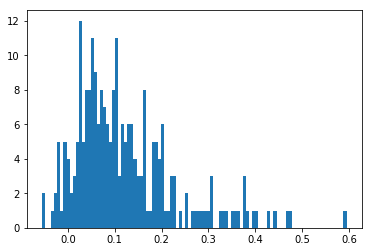

In [17]:
# histogram of cell fits
mask = np.isnan(Shat[:,0])    
Rvec = np.diagonal(1/(Ssm.shape[0]-mask.sum())*np.matmul(sp.stats.zscore(Ssm[~mask,:],axis=0).T,sp.stats.zscore(Shat[~mask,:],axis=0)))
    
f,ax= plt.subplots()
trash=ax.hist(Rvec,100)

40


C:\Users\mplitt\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


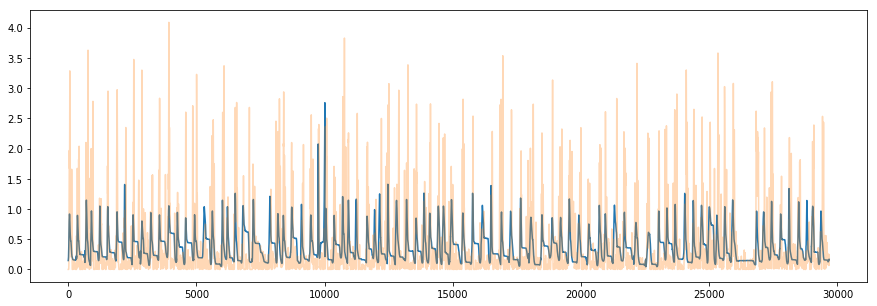

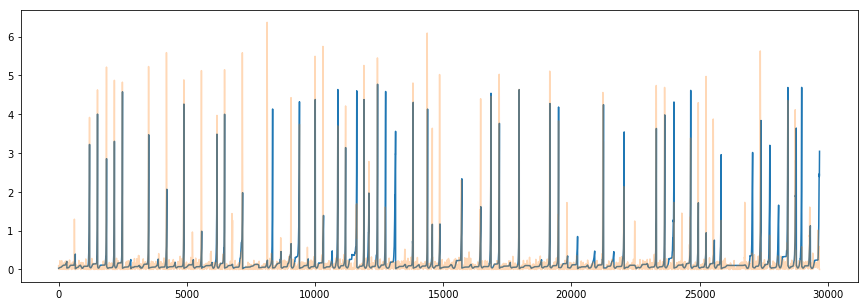

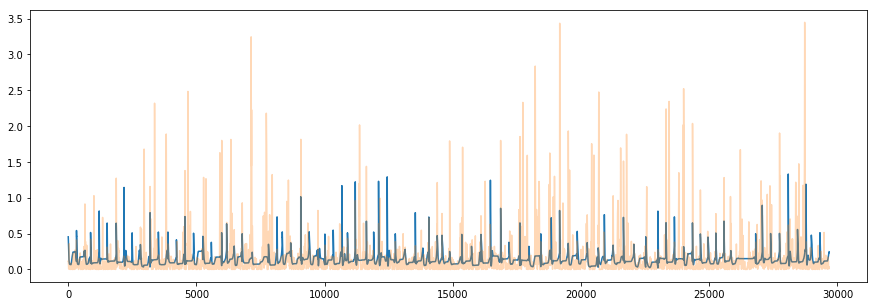

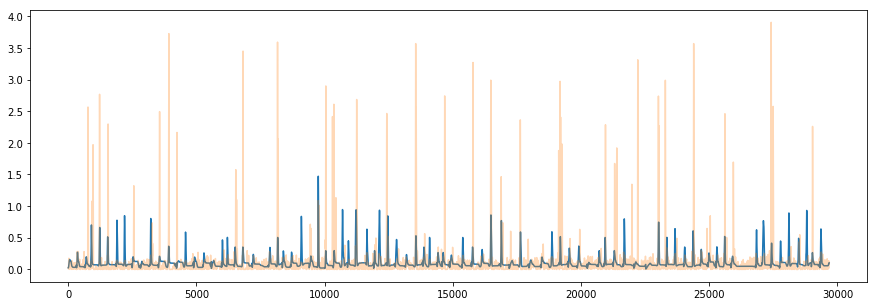

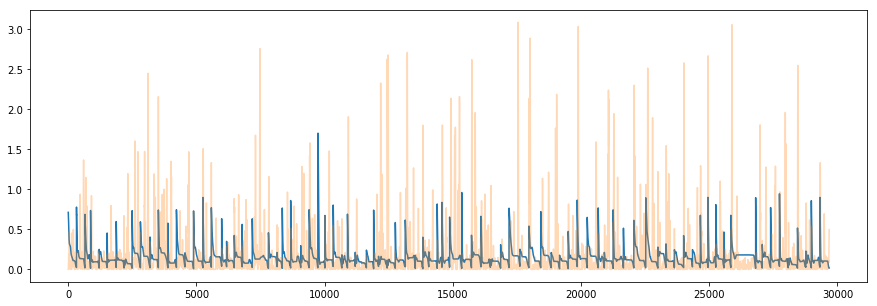

...

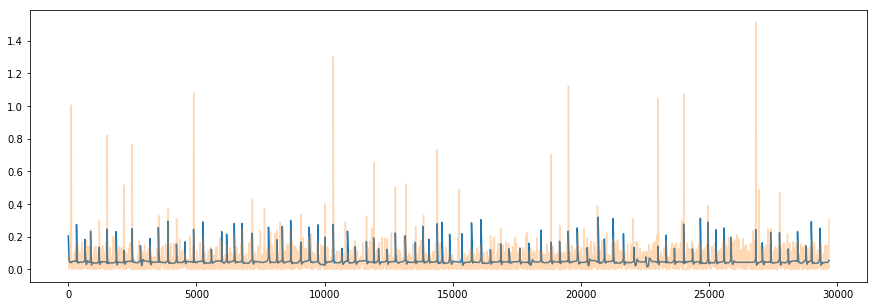

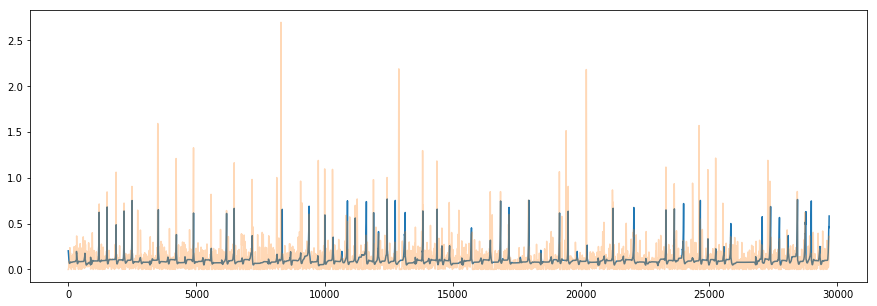

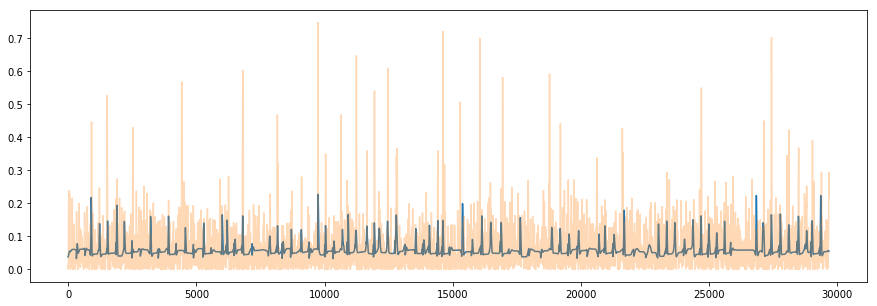

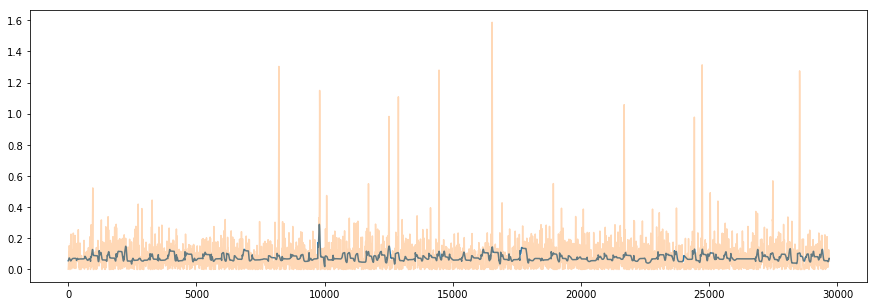

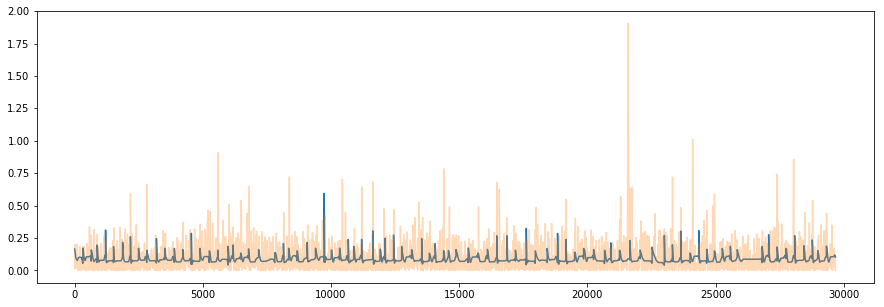

In [18]:
# pick threshold for including cells
print((Rvec>.2).sum())

cellmask = Rvec>.2
Shat_filt = Shat[~mask,:]
Shat_filt = Shat_filt[:,cellmask]
Ssm_filt = Ssm[~mask,:]
Ssm_filt = Ssm_filt[:,cellmask]
for cell in range(Shat_filt.shape[1]):
    f,ax = plt.subplots(figsize=[15,5])
    ax.plot(Shat_filt[:,cell])
    ax.plot(Ssm_filt[:,cell],alpha=.3)

# 3-fold CV for decoding

In [19]:
# fit model
Shat = np.zeros(S.shape)
Shat[:] = np.nan


L_XC = np.zeros([S.shape[0],50,50])
for i, test in enumerate(test_mask):
    print('start fold ', i)
    test = test & (VRDat['pos']._values>0) & (VRDat['pos']._values<450)
    train = ~test & (VRDat['pos']._values>0) & (VRDat['pos']._values<450)
    
    nb = NBDecodingModel()
    S_fit = Ssm[train,:]
    nb.poisson_fit(VRDat['pos']._values[train],effMorph[train],S_fit[:,cellmask])
    
    nb.poisson_predict_rate_decodingDM()

    # test on remaining time points
    S_decoding = Ssm[test,:]
    S_decoding = S_decoding[:,cellmask]
    print('decoding fold', i)
    print("\t total timepoints =",test.sum())
    L_XC[test,:,:]= nb.poisson_decode(S_decoding)
# save to big P_XC (likelihood matrix)

start fold  0
decoding fold 0
	 total timepoints = 9576
	 timepoint 0
	 timepoint 1000
	 timepoint 2000
	 timepoint 3000
	 timepoint 4000
	 timepoint 5000
	 timepoint 6000
	 timepoint 7000
	 timepoint 8000
	 timepoint 9000
start fold  1
decoding fold 1
	 total timepoints = 9996
	 timepoint 0
	 timepoint 1000
	 timepoint 2000
	 timepoint 3000
	 timepoint 4000
	 timepoint 5000
	 timepoint 6000
	 timepoint 7000
	 timepoint 8000
	 timepoint 9000
start fold  2
decoding fold 2
	 total timepoints = 10107
	 timepoint 0
	 timepoint 1000
	 timepoint 2000
	 timepoint 3000
	 timepoint 4000
	 timepoint 5000
	 timepoint 6000
	 timepoint 7000
	 timepoint 8000
	 timepoint 9000
	 timepoint 10000


C:\Users\mplitt\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\mplitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in log
C:\Users\mplitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in log


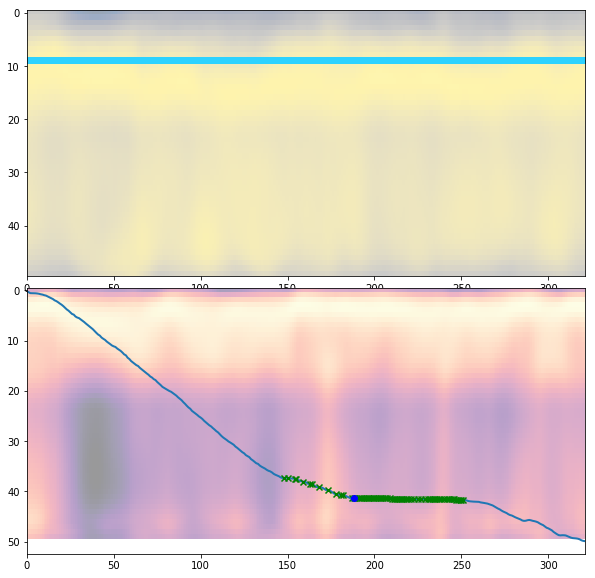

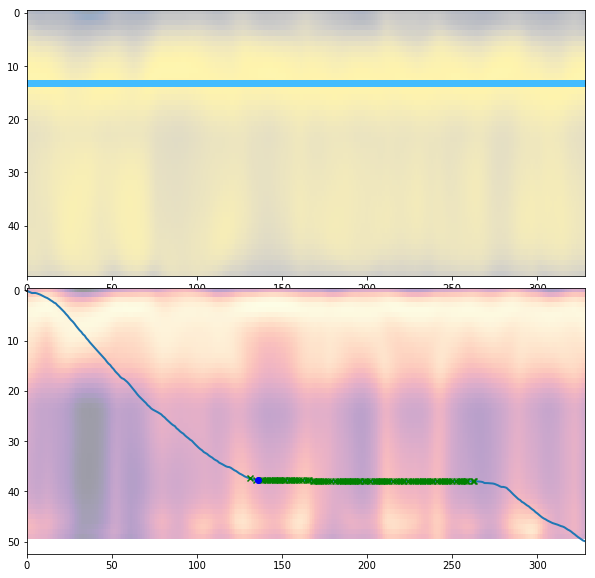

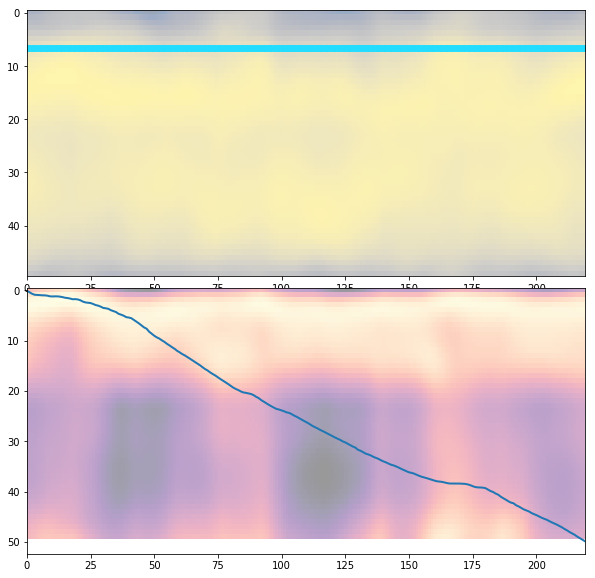

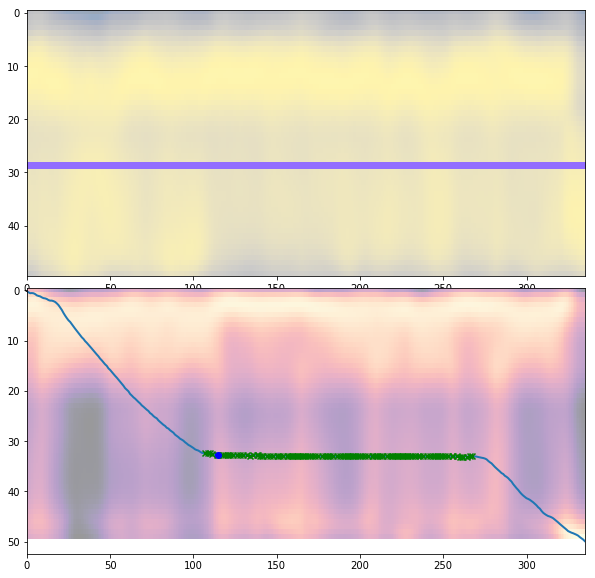

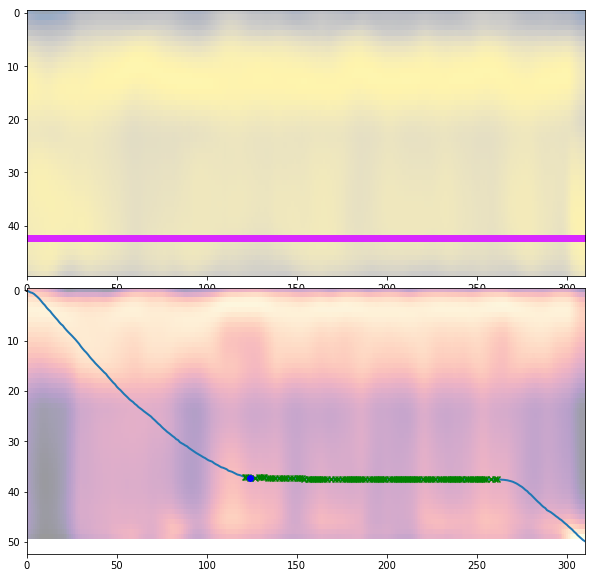

...

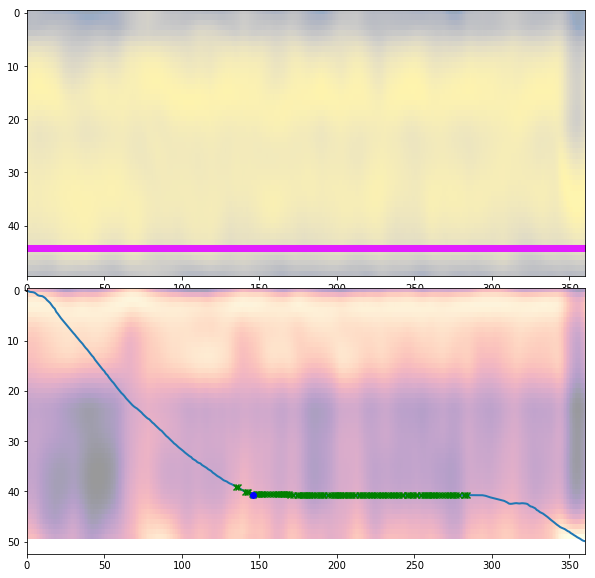

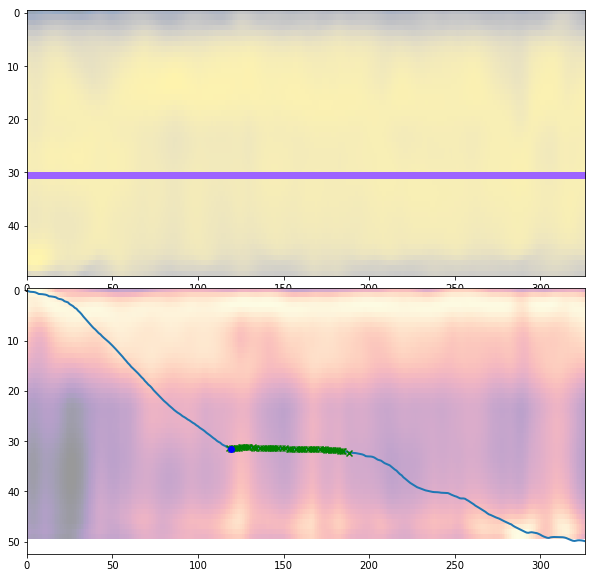

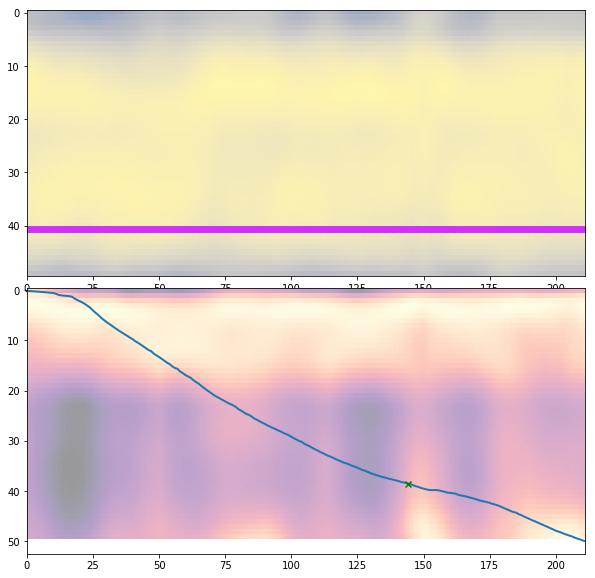

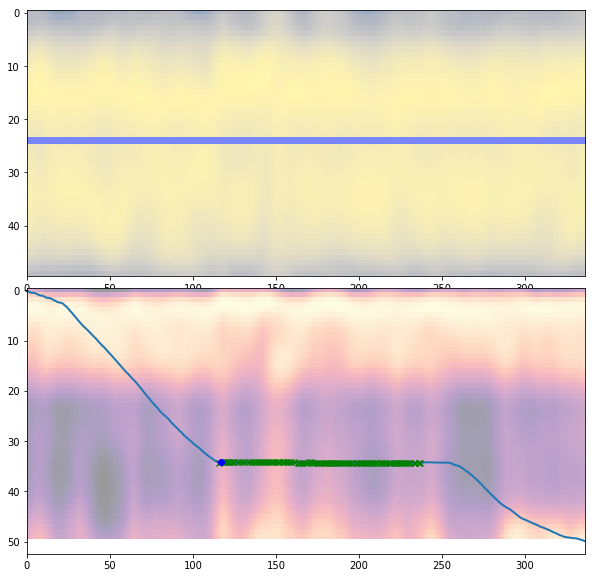

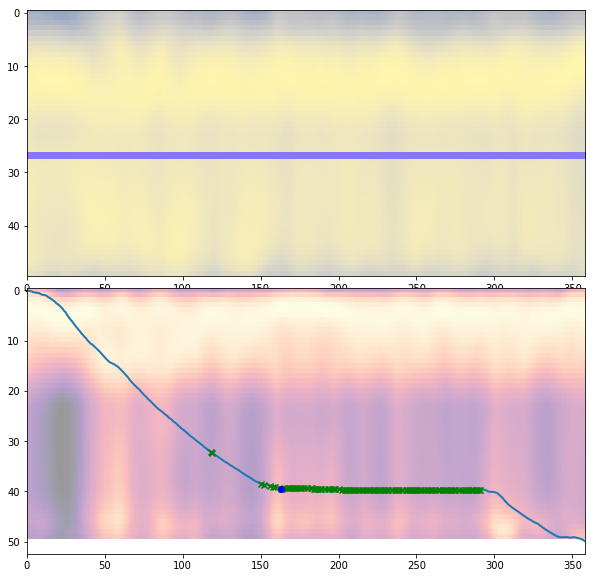

In [20]:
# bin position
pos_plot = VRDat['pos']/450.*50

# get lick position
lick_pos = u.lick_positions(VRDat.lick._values,VRDat.pos._values)/450.*50


# get reward position
reward_pos = u.lick_positions(VRDat.reward._values,VRDat.pos._values)/450.*50



# plot single trial results
for j, (start,stop) in enumerate(zip(tstart_inds.tolist(),teleport_inds.tolist())):
#     if j <2:
    gs = gridspec.GridSpec(8,1)
    f = plt.figure(figsize=[10,10])


    x = np.arange(stop-start)


    m_ax = f.add_subplot(gs[0:4,:])
    m_ax.imshow(np.log(L_XC[start:stop,:,:].sum(axis=1)).T,aspect='auto',cmap='cividis',zorder=0,alpha=.4)
    m_ax.scatter(x,effMorph[start:stop]*50,marker='o',color=plt.cm.cool(effMorph[start:stop].mean()),zorder=1)
    m_ax.set_xlim([0,x[-1]])

    pos_ax = f.add_subplot(gs[4:,:])
    pos_ax.imshow(np.log(L_XC[start:stop,:,:].sum(axis=2)).T,aspect='auto',cmap='magma',zorder=0,alpha=.4)
    pos_ax.plot(x,pos_plot[start:stop],linewidth=2,zorder=1,alpha=1)
    pos_ax.scatter(x,lick_pos[start:stop],marker='x',color='green',zorder=2)
    pos_ax.scatter(x,reward_pos[start:stop],marker='o',color='blue',zorder=2)
    pos_ax.set_xlim([0,x[-1]])


In [21]:
L_XC_trial_mat = u.make_pos_bin_trial_matrices(L_XC.reshape([L_XC.shape[0],-1]),VRDat['pos']._values,VRDat['tstart']._values,VRDat['teleport']._values,bin_size=10,speed=VRDat.speed._values,mat_only=True)

In [22]:
L_XC_dict = u.trial_type_dict(L_XC_trial_mat,trial_info['morphs'])

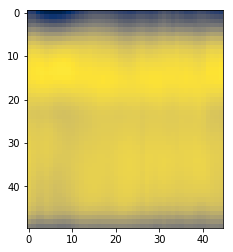

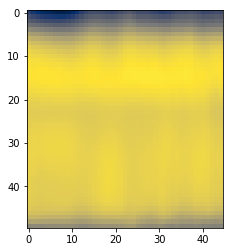

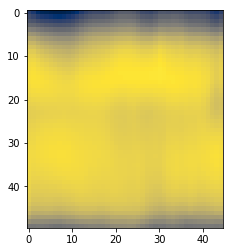

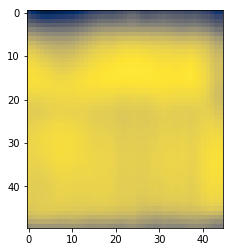

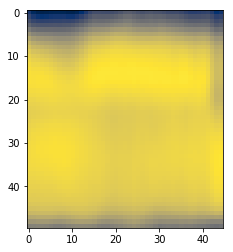

In [23]:
for m in [0,.25,.5,.75,1]:
    tmpLXC = L_XC_dict[m]
    tmpLXC = tmpLXC.reshape([tmpLXC.shape[0],tmpLXC.shape[1],50,50])
    tmpLC = np.mean(np.log(tmpLXC.sum(axis=2)),axis=0)
    f,ax = plt.subplots()
    ax.imshow(tmpLC.T,cmap='cividis')


In [63]:
P_XX = np.zeros([50,50])
for start,stop in zip(tstart_inds.tolist(),teleport_inds.tolist()):
    tmppos = VRDat.pos._values[start:stop-1]
    h,xbin,ybin = np.histogram2d(tmppos[:-1],tmppos[1:],np.linspace(0,450,num=51))
    P_XX+=h

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1.]


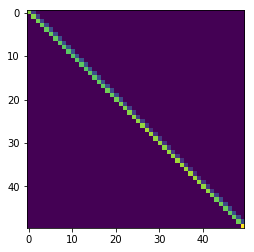

In [64]:
f,ax = plt.subplots()
ax.imshow(P_XX/P_XX.sum(axis=1).reshape([-1,1]))
P_XX+=1E-4
P_XX/=P_XX.sum(axis=1).reshape([-1,1])

print(P_XX.sum(axis=1))

C:\Users\mplitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in log
C:\Users\mplitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in subtract
C:\Users\mplitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in log
C:\Users\mplitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:36: RuntimeWarning: divide by zero encountered in log
C:\Users\mplitt\Anaconda3\lib\site-packages\matplotlib\image.py:395: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\mplitt\Anaconda3\lib\site-packages\matplotlib\image.py:396: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\mplitt\Anaconda3\lib\site-packages\matplotlib\image.py:403: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\mplitt\Anaconda3\lib\site-pack

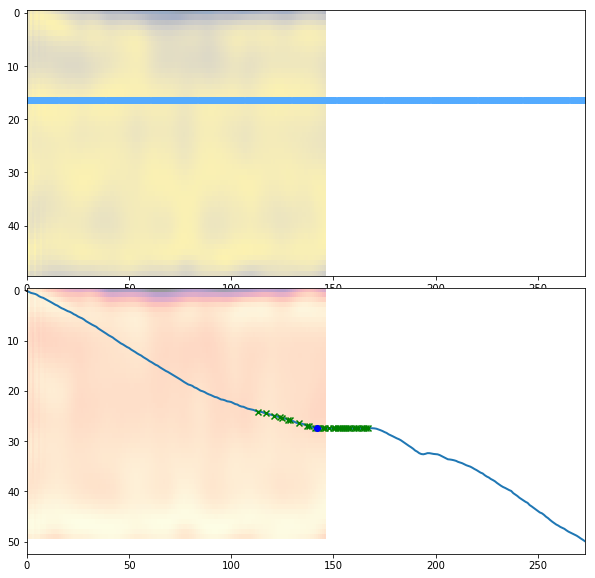

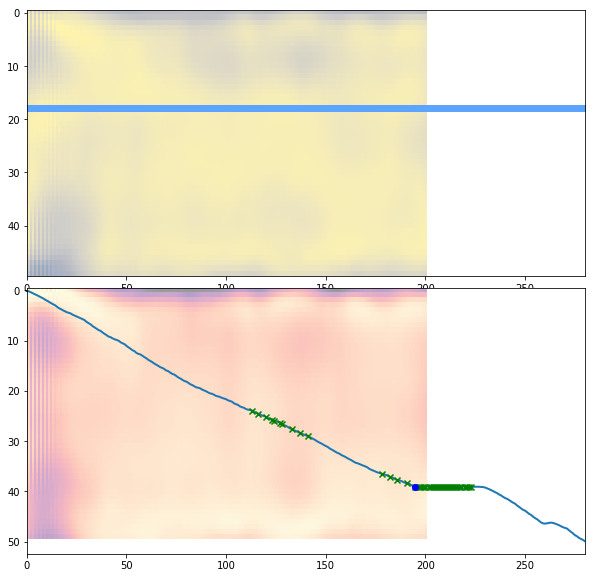

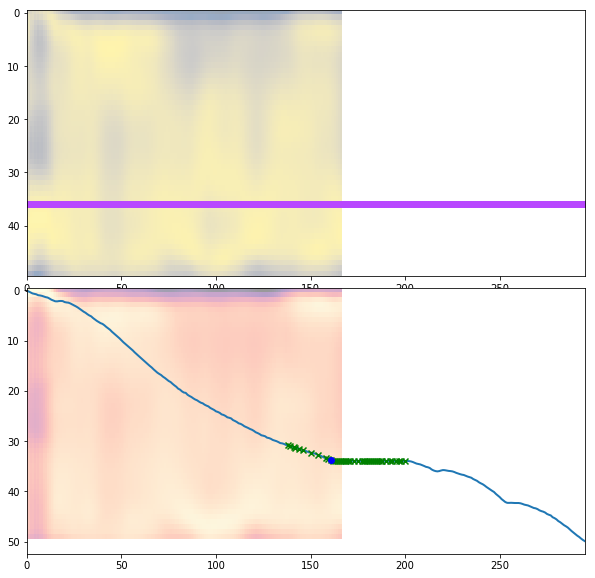

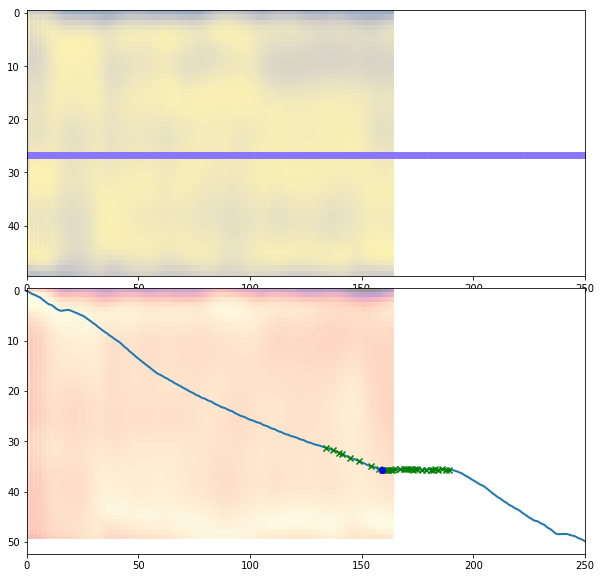

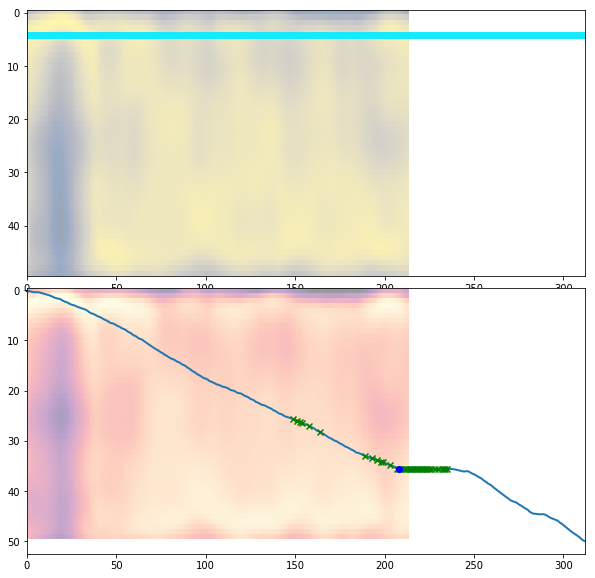

...

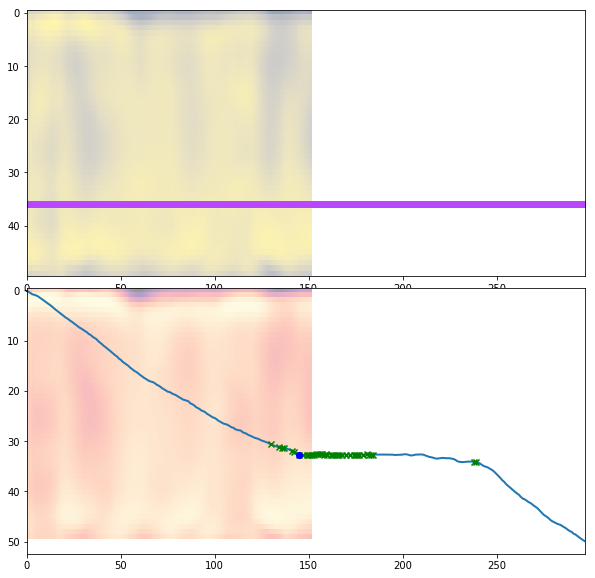

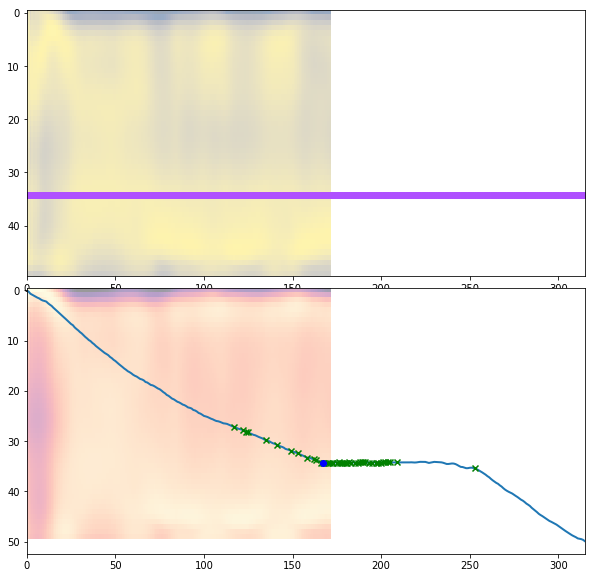

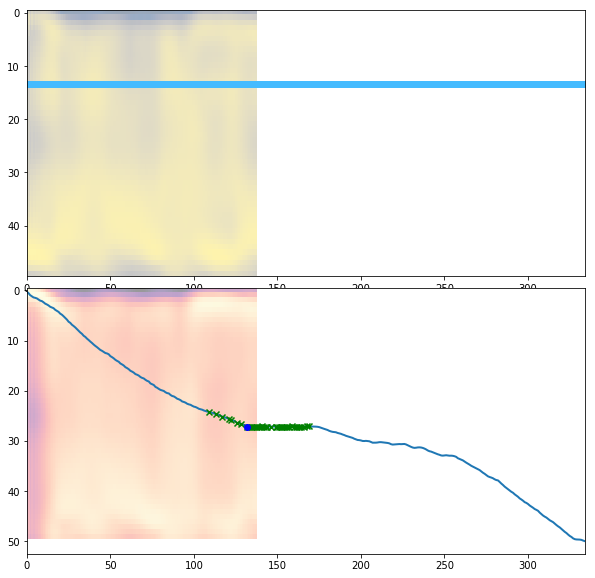

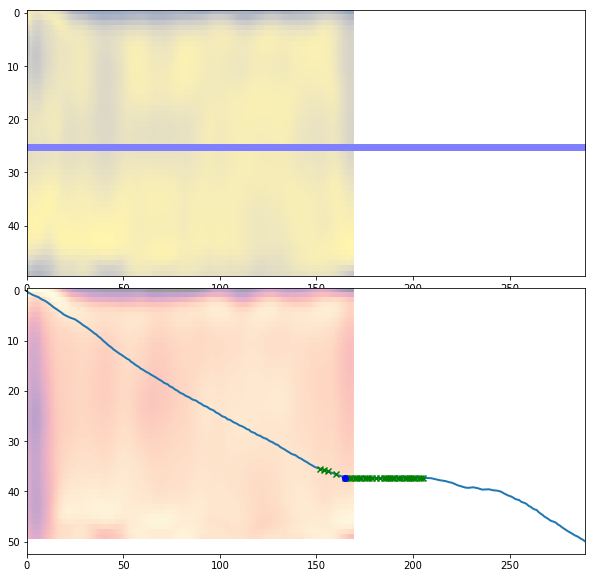

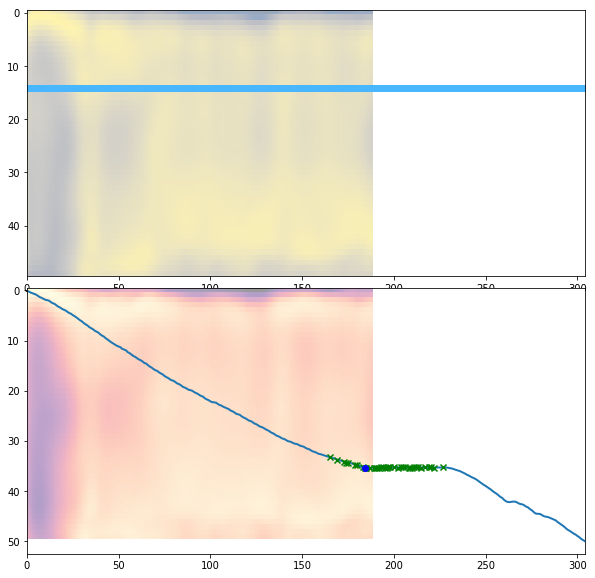

In [65]:
# plot single trial results
for j, (start,stop) in enumerate(zip(tstart_inds.tolist(),teleport_inds.tolist())):
#     if j <2:
    gs = gridspec.GridSpec(8,1)
    f = plt.figure(figsize=[10,10])


    x = np.arange(stop-start)
    POST = np.zeros([stop-start,50,50])
    L_tmp = L_XC[start:stop,:,:]
    for t in range(stop-start):
        _L_XC = L_tmp[t,:,:]
        if t==0:
#             _L_X = _L_XC.sum(axis=1)
#             px0 = np.zeros([50,1])
#             px0[0] = 1.
#             post_num = _L_XC*px0
# #             post_num = post_num*np.ones([1,50])
#             post_num/=post_num.ravel().sum()
            POST[0,:,:]= _L_XC
        else:
            prevPOST = POST[t-1,:,:].sum(axis=-1)
            post_num = np.log(_L_XC) + np.log(np.matmul(P_XX,prevPOST))
            A = np.amax(post_num)
            log_denom = A + np.log(np.exp(post_num.ravel()-A).sum())
#             post_num /= post_num.ravel().sum()
            POST[t,:,:]=np.exp(post_num-log_denom)
            

    m_ax = f.add_subplot(gs[0:4,:])
    m_ax.imshow(np.log(POST.sum(axis=1)).T,aspect='auto',cmap='cividis',zorder=0,alpha=.4)
    m_ax.scatter(x,effMorph[start:stop]*50,marker='o',color=plt.cm.cool(effMorph[start:stop].mean()),zorder=1)
    m_ax.set_xlim([0,x[-1]])

    pos_ax = f.add_subplot(gs[4:,:])
    pos_ax.imshow(np.log(POST.sum(axis=2)).T,aspect='auto',cmap='magma',zorder=0,alpha=.4)
    pos_ax.plot(x,pos_plot[start:stop],linewidth=2,zorder=1,alpha=1)
    pos_ax.scatter(x,lick_pos[start:stop],marker='x',color='green',zorder=2)
    pos_ax.scatter(x,reward_pos[start:stop],marker='o',color='blue',zorder=2)
    pos_ax.set_xlim([0,x[-1]])